https://nbviewer.jupyter.org/gist/Carreau/5507501/the%20sound%20of%20hydrogen.ipynb

The goal of this notebook is show how one can write a sound file to the disk, and use Html5 <audio> tag to play it dirrectly inside te notebook.
    
To do this we use the spectrum spectrum of hydrogen that we shift the into the audible range.

Plese be aware that the html5 player might not work in nbviewer.

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [8]:
from __future__ import division
import scipy.constants as const
import scipy
from scipy.io import wavfile
from IPython.core.display import HTML

In [9]:
# this is a wrapper that take a filename and publish an html <audio> tag to listen to it

def wavPlayer(filepath):
    """ will display html 5 player for compatible browser

    Parameters :
    ------------
    filepath : relative filepath with respect to the notebook directory ( where the .ipynb are not cwd)
               of the file to play

    The browser need to know how to play wav through html5.

    there is no autoplay to prevent file playing when the browser opens
    """
    
    src = """
    <head>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <title>Simple Test</title>
    </head>
    
    <body>
    <audio controls="controls" style="width:600px" >
      <source src="files/%s" type="audio/wav" />
      Your browser does not support the audio element.
    </audio>
    </body>
    """%(filepath)
    display(HTML(src))

In [10]:

rate = 44100 #44.1 khz
duration =5 # in sec

# this will give us sin with the righ amplitude to use with wav files
normedsin = lambda f,t : 2**13*sin(2*pi*f*t)

time = np.linspace(0,duration, num=rate*duration)

## Test the wav Player

let's try to first just play an A (440 Hz).

In [11]:
pwd

'/nethome/storage/raid1/n.kusampudi/Navy_pesonal_Git/Fractals/sound'

In [12]:
# define A as a 440 Hz sin function 
la    = lambda t : normedsin(440,t)

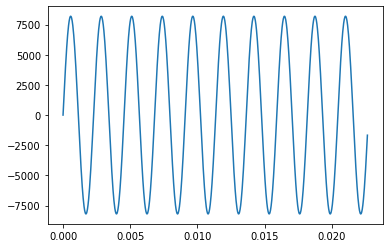

In [13]:
# look at it on the first 25 ms
plot(time[0:1000], la(time)[0:1000])

In [14]:
# write the file on disk, and show in in a Html 5 audio player
wavfile.write('440.wav', rate, la(time).astype(np.int16))
wavPlayer("440.wav")

The differents frequencies emmited by an hydrogen atom is given by the rydberg formulae :

${1 \over \lambda}  = R \left({1\over n_1}-{1\over n_2}\right)$

Which gives a similar relation on the emitted frequencies of the Hydrogen :
$f_{n,m}={c \over \lambda}  = {R_h\over h} \left({1\over n}-{1\over m}\right)$

for n=1 we've got the Lyman series, and for n=2 we have the Balmer series

In [17]:
# fondamental frequency of hydrogen
f0 = const.Rydberg*const.c
print("The highest frequency of hydrogen is ",f0,"Hz. and correspond to n = 1, m = ∞")
fshift = 440
print("we can shift the spectrum for it to be at 440 Hz (A)")

The highest frequency of hydrogen is  3289841960355208.5 Hz. and correspond to n = 1, m = ∞
we can shift the spectrum for it to be at 440 Hz (A)


In [18]:
ryd = lambda n,m : fshift*(1/(n**2) -1/(m**2))
flyman = lambda x : ryd(1,x)
fbalmer = lambda x : ryd(2,x)

In [19]:
## define the sum, 
ser = lambda t : sum( [normedsin(flyman(i),t)+normedsin(fbalmer(i+1),t) for i in range(2,8)])

# and a verorialized function to work on a by element basis with matlab
serv = scipy.vectorize(ser)

In [20]:
ss = serv(time)

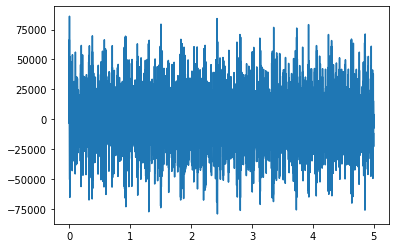

In [21]:
plot(time,ss)
ss = 2**15*ss/ ss.max()

In [22]:
wavfile.write('hydrogen.wav', rate, ss.astype(np.int16))
wavPlayer('hydrogen.wav')

In [23]:
import plotly.express as px
import pandas as pd
from plotly.subplots import make_subplots

# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [24]:
def plot_scatter(x):
    
    fig = go.Figure(data=go.Scattergl(
                                x = [i for i in range(x.shape[0])],
                                y = x,
                                mode ="markers",
                                marker=dict(size=3)
                                ))                                   #color=[i for i in range(x_plot.shape[0])]
    fig.show()

In [25]:
plot_scatter(ss)